___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Session - 3<br><br>Regression with ANN<br><br>KC House Data<br><h1>

# Keras Regression

In [123]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [124]:
#!pip install folium          # harita cizimi icin gerekli library

In [125]:
#from google.colab import drive
#drive.mount('/content/drive')

In [126]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [127]:
#from matplotlib import style
#style.use('dark_background')

In [128]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [129]:
# ev fiyatlari tahmin etmek üzerine bir data

In [130]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [131]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [132]:
df.isnull().sum().any() # hic nan value yoktur

False

In [133]:
df.describe().T

# price; 75% ile max araisinda ucurum var bakinabilir.
# bedrooms, bathrooms, sqft_living, sqft_lot, sqft_above, sqft_basement incelnmesi gereken sütunlar

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### İd_number

In [134]:
df = df.drop('id', axis = 1) 

### price

In [135]:
# ilk önce target feature incelenilmelidir.

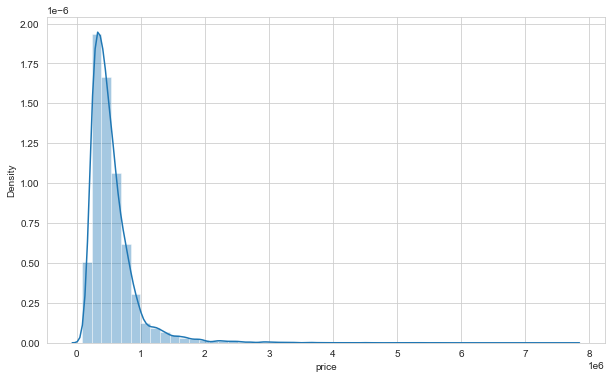

In [136]:
sns.distplot(df['price']);

In [137]:
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


In [138]:
# price sütununda celiskili bir durum yok.
# Fiyatı yüksek olanların grade i çok yüksek. 
# Bazılarının deniz kenarında olmaları, bazılarında manzaralı olması dikkat çekiyor. 
# Metrekarelere ve yapılış tarihlerine de baktığımızda herhangi bir yanlış girilmiş data olduğunu düşünmüyoruz.
# Yani bu fiyatları hak eden evler. outlier yok.

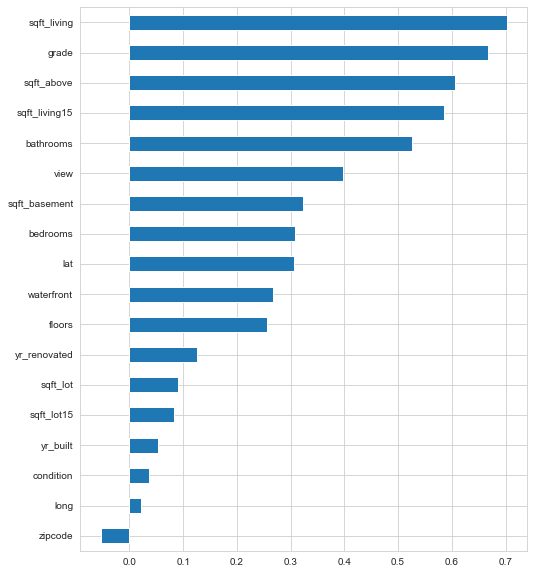

In [139]:
plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");

# en büyük corr sqt_living ile

In [ ]:
# Fiyat ile yaşam alanın büyüklüğü en yüksek korelasyona sahip. 
# Oda sayısı, basement dışı alan, deniz kenarında olması da yine fiyata en çok etki eden faktörler arasında. 

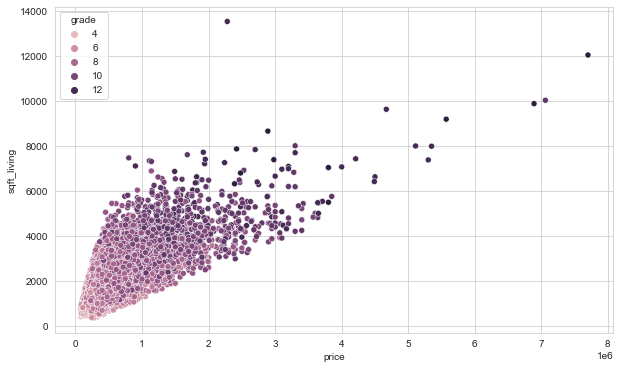

In [140]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");
# yasam alani büyüdükce fiyat artmakta
# ayni sekilde derecelendirme de yükselmektedir.

### bedrooms

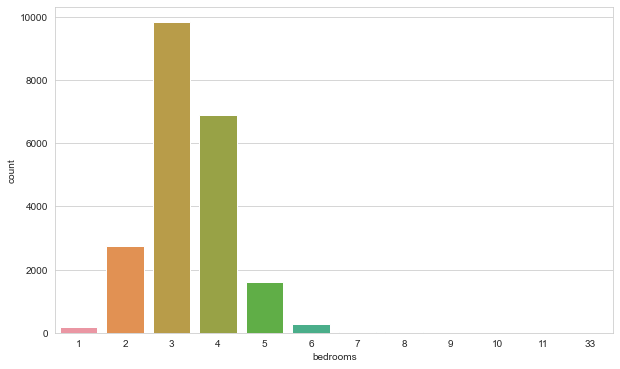

In [141]:
sns.countplot(df['bedrooms']);
# 33 gibi extrem degerler var

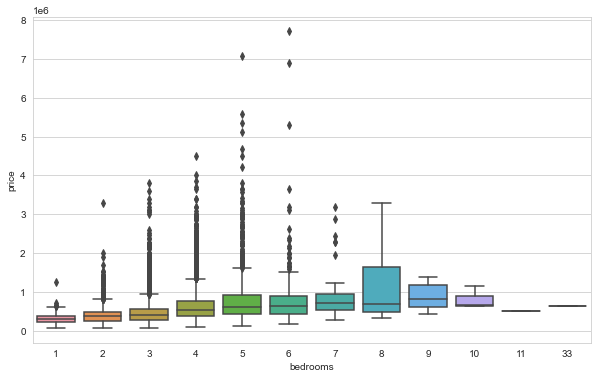

In [142]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

# 11 ve 33 fiyatlari normal gözüküyor.daha pahali olmasi grekirken, bir inceleyelim

In [143]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [144]:
# Oda sayısı 10 dan büyük olanlara baktım. 33 odalı evin 1.75 banyosu var. 
# Bu evin yanlış olarak girildiğini düşünüyorum.

In [145]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [146]:
df.shape

(21596, 20)

### date

In [147]:
df['date'].dtype

dtype('O')

In [148]:
df['date'] = pd.to_datetime(df['date']) #datetime a cevirdik

In [149]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [150]:
df['year'] = df['date'].dt.year # year i aliyoruz
#df['year'] = df['date'].apply(lambda date : date.year)

In [151]:
df['month'] = df['date'].dt.month # month u alyioruz.

In [152]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


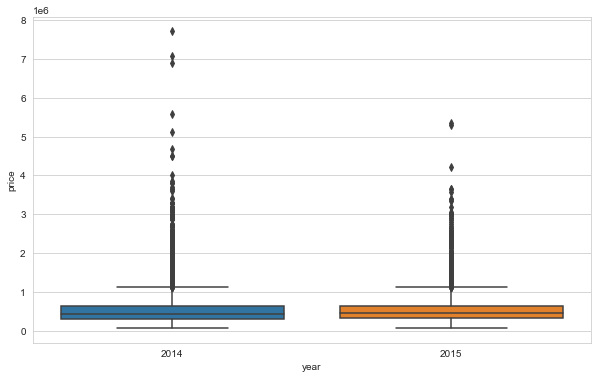

In [153]:
sns.boxplot(x = 'year', y = 'price', data = df);
#anlamli bir artis yoktur.

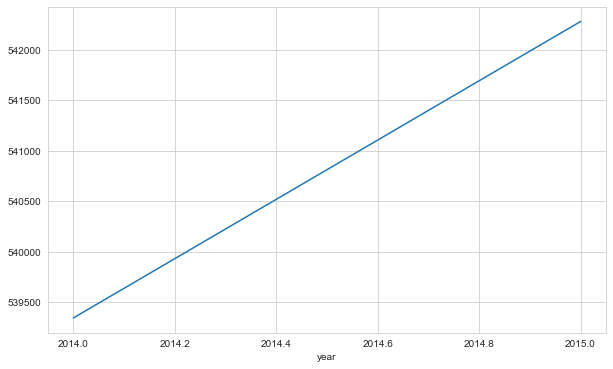

In [154]:
df.groupby('year')['price'].mean().plot(); #hafif bir artis vardir.

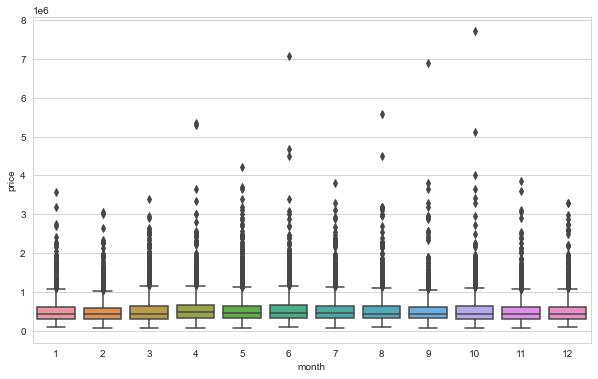

In [155]:
sns.boxplot(x = 'month', y = 'price', data = df); 

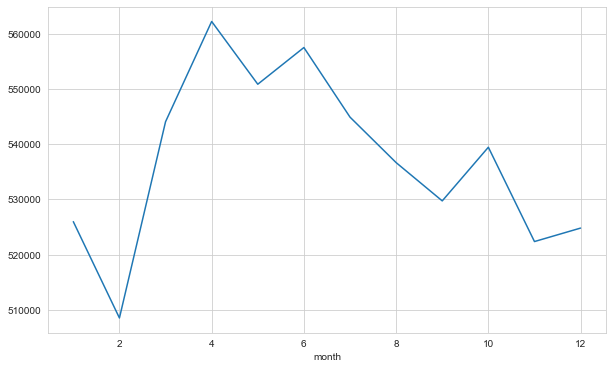

In [156]:
df.groupby('month')['price'].mean().plot(); #

In [157]:
# month_dummy = pd.get_dummies(df["month"], prefix = "month")    #dummy siz devam ettik.
# df = pd.concat([df, month_dummy], axis = 1)
# df.head()

In [158]:
df = df.drop(['date', "year", "month"], axis = 1)

### zipcode

In [159]:
df['zipcode'].value_counts(dropna = False)

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

- posta kodlarını bölgelere göre kuzey, güney, batı, doğu, orta olarak sınıflandırabiliriz. Ancak manuel olarak yapılabilir ve çok zaman alabilir ve bunu yapmak için alan bilgisine ihtiyacımız var. Bu yüzden bu sütunu bırakacağız.

In [160]:
df = df.drop('zipcode', axis = 1)

### yr_renovated & yr_built

In [161]:
df['yr_renovated'].value_counts(dropna = False) 
# 0 demek renove edilmemis evler, tarihler de renove edilmis evler
# 0 olanların sayısı diğerlerine göre oldukça fazla. 
# scale ettiğimde bunları 1 ile 0 arasına sıkıştıracağı için renovated yıllarının bir etkisi kalmayacaktır. 
# bu birinci yaklaşım

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

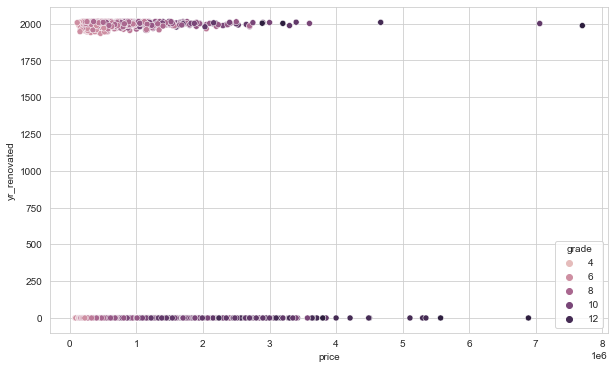

In [162]:
sns.scatterplot(x = 'price',y = 'yr_renovated', data = df, hue = "grade");

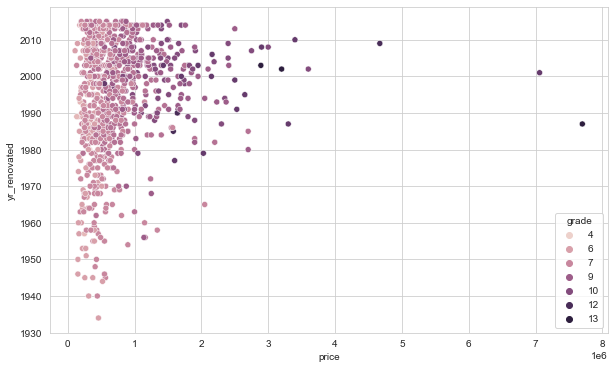

In [163]:
sns.scatterplot(x = 'price',y = 'yr_renovated', data = df[df.yr_renovated!=0], hue = "grade"); 
# renove edilmis evler

# renove edilmis evlerin fiyati daha yüksek diyebiliriz. Tabi ki derecesi de daha iyi

In [164]:
df['yr_built'].value_counts(dropna = False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

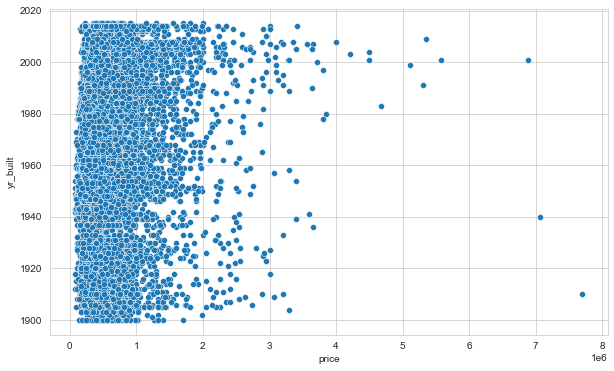

In [165]:
sns.scatterplot(x = 'price',y = 'yr_built', data = df); # cok bir sey vermedi

In [166]:
df.yr_renovated.apply(lambda x : x if x == 0 else 1).value_counts()
# yeni bir sütun olustturuyoruz. 0 --> renove edimemis, 1--> renove edilmis

0    20682
1      914
Name: yr_renovated, dtype: int64

In [167]:
df["renovated"] = df.yr_renovated.apply(lambda x : x if x == 0 else 1)

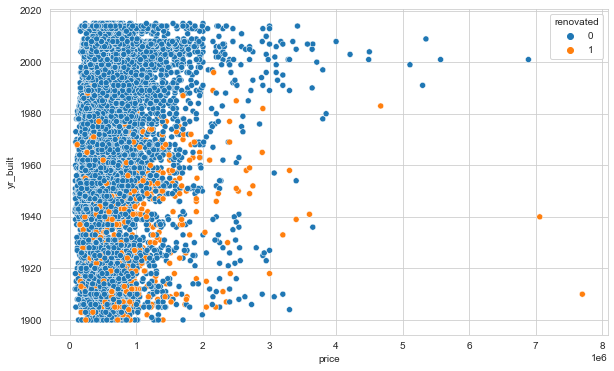

In [168]:
sns.scatterplot(x = 'price',y = 'yr_built', data = df, hue = "renovated");
# Örnegin 1910 yilindaki ev renove edilmis o yüzden pahali

In [169]:
df["built|renovated"] = df["yr_renovated"].replace(0, np.nan).fillna(df["yr_built"])
df["built|renovated"]

# önce 0 değerlerini nan yaptım.
# sonra bu nan ları yapım yılı olarak değiştirdim. yr_renovated artık 0 lardan kurtuldu.
# built ile renovated i birlestirdik.
# renovation,evi tamamen yenilemekse yaptigimiz islem dogrudur.Eger kismi renovation ise islem o kadar dogru degildir.

0       1955.000
1       1991.000
2       1933.000
3       1965.000
4       1987.000
          ...   
21592   2009.000
21593   2014.000
21594   2009.000
21595   2004.000
21596   2008.000
Name: built|renovated, Length: 21596, dtype: float64

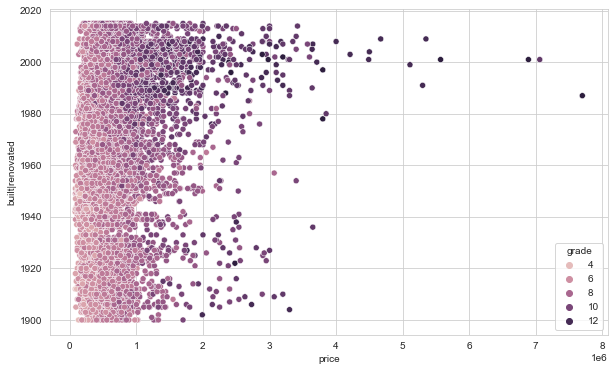

In [170]:
sns.scatterplot(x = 'price',y = 'built|renovated', data = df, hue = "grade");

In [171]:
df.drop(["yr_renovated", "yr_built", "renovated"], axis = 1, inplace = True)
# df.drop(["built|renovated", "renovated"], axis = 1, inplace = True)

could make sense due to scaling, higher should correlate to more value

- ölçeklendirme nedeniyle mantıklı olabilir, daha yüksek daha fazla değerle ilişkilendirilmelidir

### sqft_basement

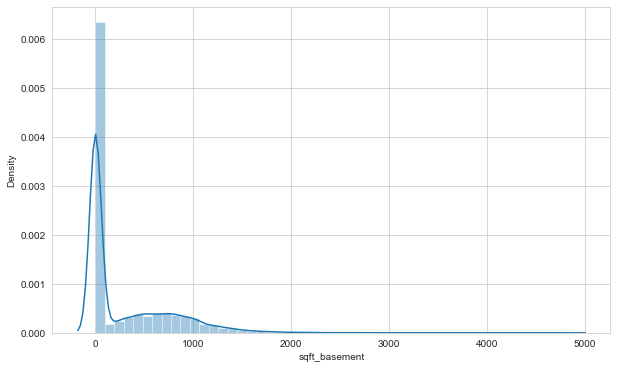

In [172]:
sns.distplot(df['sqft_basement']);

In [173]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

# sqft_above + sqft_basement = sqft_living 
# 3 veri de dogru girilmistir. O yüzden extrem veri olmasina ragmen birakiyoruz.

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,47.557,-122.210,3270,10454,2009.000
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,47.593,-122.086,4913,14663,1991.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,47.576,-122.242,4480,16471,1980.000


could make sense due to scaling, higher should correlate to more value

- ölçeklendirme nedeniyle mantıklı olabilir, daha yüksek daha fazla değerle ilişkilendirilmelidir

### sqft_above

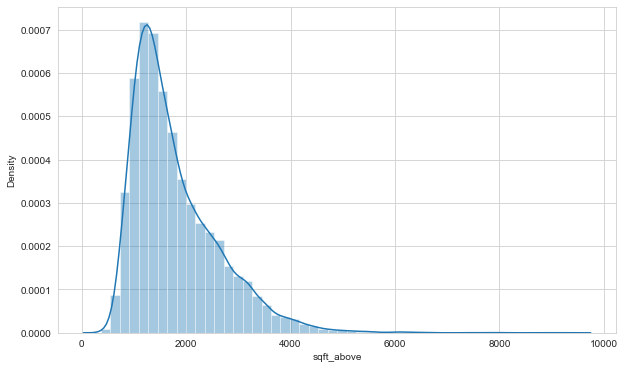

In [174]:
sns.distplot(df['sqft_above']);

# extrem degerler var. 6000 üstüne bakalim

In [175]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

# sikinti yoktur.

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,47.667,-121.986,4850,217800,1999.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,47.568,-122.189,4160,18969,2001.000
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,47.733,-122.362,2740,10761,1996.000
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,47.541,-121.982,6210,95832,2006.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,47.455,-121.764,5610,169549,2002.000
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,47.447,-122.086,3270,34500,1992.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000


### Geographical Properties

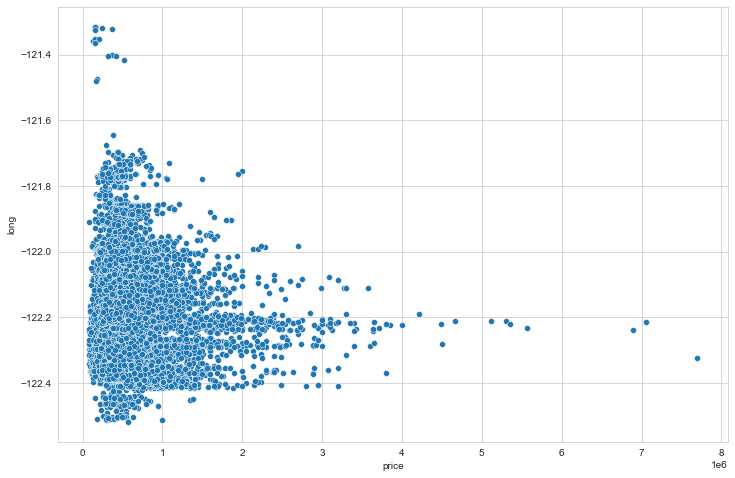

In [176]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

# 122.2 denk gelen boylamda daha yüksek evler var

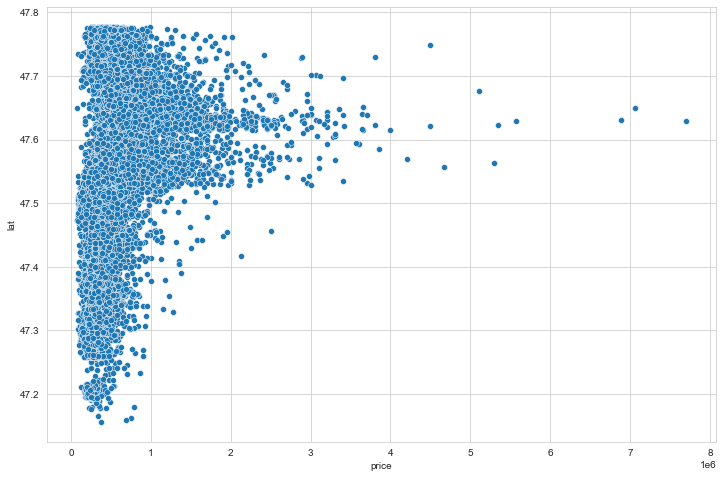

In [177]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

# 47.6 enlemli yerler pahali evler

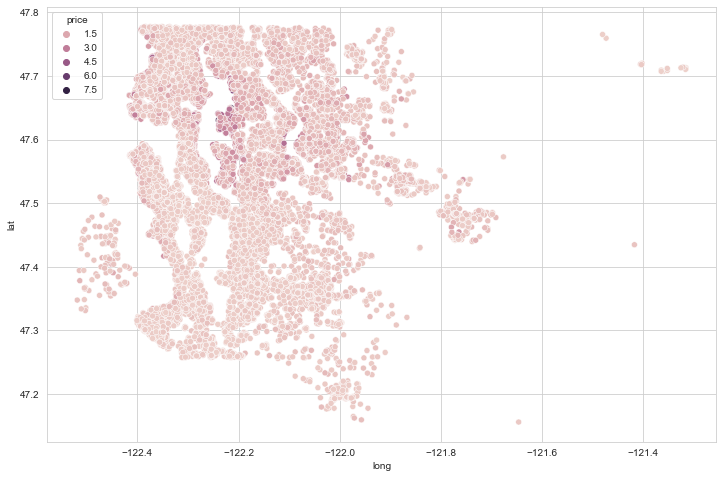

In [178]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

# kapali renkler pahali evler
# acik renkler ucuz evler

In [179]:
len(df) * (0.01) 
# ilk 216 satir

215.96

In [180]:
df.sort_values('price', ascending = False).head(216)
# fiyatının yüksekliğine göre ilk 216 satırı getirdim.

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,47.630,-122.323,3940,8800,1987.000
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,47.650,-122.214,3930,25449,2001.000
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,47.630,-122.240,4540,42730,2001.000
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,47.629,-122.233,3560,24345,2001.000
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,47.623,-122.220,4600,21750,2009.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,47.626,-122.291,2180,6037,2007.000
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,47.632,-122.192,2540,26287,1990.000
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,47.638,-122.219,2180,10800,2007.000
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,47.620,-122.212,2370,13320,1951.000


In [181]:
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]
# 216dan sonrakileri bana getir. (yani fiyat olarak %1 lik kısım dışında kalanlar)

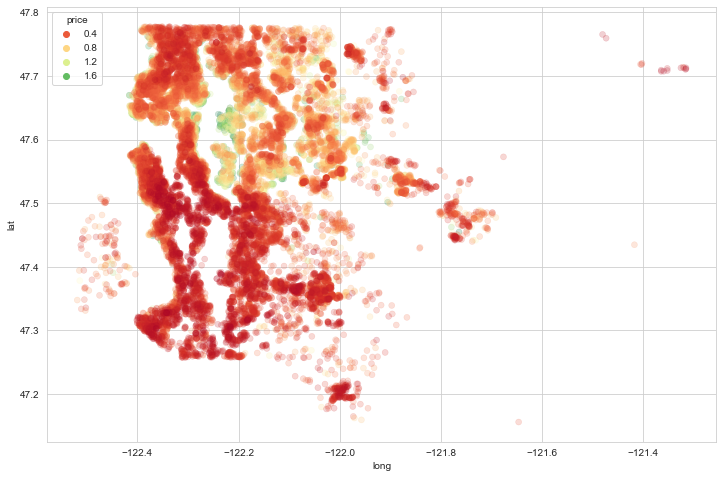

In [182]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

# biraz daha renkerl arasinda daha iyi bir ayrim var

In [183]:
import folium
import branca.colormap as cm

In [184]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)
# merkez noktasini buluyoruz aslinda
# Su kenari evlerin daha pahali oldugu gözlemlenmektedir.

In [185]:
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

# daha iyi görsel edenilmek icin 5 nokta verdim 4 aralik verecek.

In [186]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10)
colormap = cm.StepColormap(colors=["red","orange","yellow","green"] ,
                           index=[step_1, step_2, step_3, step_4, step_5],
                           vmin=step_1,
                           vmax=step_5)
for loc, p in zip(zip(df['lat'], df['long']),df["price"]): #koordinatlari tuple haline getiridi
      folium.Circle(
      location=loc,
      radius=1,
      fill=True, 
      color=colormap(p)
      ).add_to(m)
m

# step_1, step_2 arasi-->red ,step_2, step_3 arsi -->orange, step_3, step_4 arasi ise --> yellow, step_4, step_5 aras ise -->green

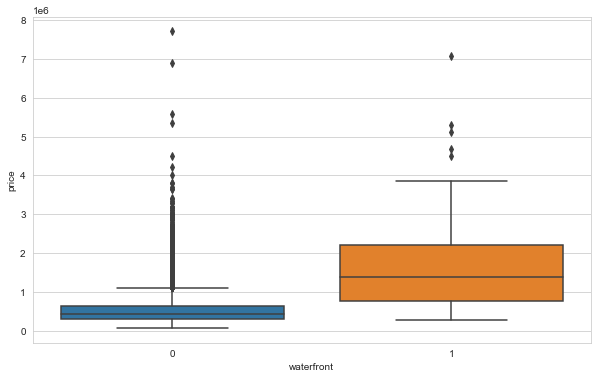

In [187]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

# su keanarinda ise fiyat artiyor

In [188]:
df.groupby("waterfront").price.mean()

# su kenarinda olanlar ortalama 1662524.184 degerinde
# su kenarinda olmayanlar ortalama  531757.274 degerinde

waterfront
0    531757.274
1   1662524.184
Name: price, dtype: float64

### latest data

In [189]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,47.721,-122.319,1690,7639,1991.000
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,47.738,-122.233,2720,8062,1933.000
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,47.521,-122.393,1360,5000,1965.000
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,47.617,-122.045,1800,7503,1987.000


In [190]:
df.shape

(21596, 17)

## Preprocessing of Data
- Train | Test Split, Scalling

In [191]:
from sklearn.model_selection import train_test_split

In [192]:
X = df.drop('price', axis = 1)
y = df['price']

In [193]:
seed = 101  # kücük data setlreinde ayni sonucu alabilmek icin # büyük datalarda olmuyor.

In [194]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=seed)

In [195]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.
# Verilerde çok fazla aykırı değer varsa scaler ölçekleyici kullanılmalıdır, aksi takdirde minmax kullanılabilir.

In [196]:
scaler = MinMaxScaler()

In [197]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [198]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

# Activation bazen ayri bir katman oolarka alabilyiroz

In [199]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [200]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [201]:
X_train.shape

(19436, 16)

In [202]:
tf.random.set_seed(seed) #ayni sonucu almak adina 

model = Sequential() # benim katmanlarim seri sekilde arka arkaya gelecek

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1])) # input_dim = 16
#model.add(Activation("relu")) # Activation function can be added separately as a different line after each layer. # # Aktivasyon fonksiyonu her katmandan sonra ayrı bir satır olarak eklenebilir.  
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1)) #regreson problemi ile calistigimizdan dolayi 1 Output olmalidir.

model.compile(optimizer = 'adam', loss = 'mse') # cost_function mse belriledik. adam cok kullanilan optimizer

# Kac nöron kullanicagimiza shape bakarak, input sayisinin 1.5 katini alin, 
# diger katmanlarda azaltarak gidin diye tavsiye ediliyor.
# 16 * 1.5 =24 
#24 /2 = 12 
# 12 / 2 = 6

# Regresyon da relu kullanilmaktadir. Tanh kullanilabilr ama daha yavas 
# Model ögrenmiyorsa nöron sayisi, batch_size,katman sayisi   degistirilebilir. 
# Bol bol makale okunulmalidir. Yogurt yiyisi :)

In [203]:
model.summary() 
#Toplam parametre sayisi=(16*24+24)+(24*24+24)+(24*12+12)+(12*6+6)+(6*1+1)

# 16*24 +24

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_25 (Dense)            (None, 24)                408       
                                                                 
 dense_26 (Dense)            (None, 24)                600       
                                                                 
 dense_27 (Dense)            (None, 12)                300       
                                                                 
 dense_28 (Dense)            (None, 6)                 78        
                                                                 
 dense_29 (Dense)            (None, 1)                 7         
                                                                 
Total params: 1,393
Trainable params: 1,393
Non-trainable params: 0
_________________________________________________________________


In [204]:
model.weights

[<tf.Variable 'dense_25/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-2.05098093e-02, -1.82524621e-01, -3.77154887e-01,
         -2.03917280e-01, -2.79870629e-03,  2.20505059e-01,
          3.75805795e-01,  1.59454823e-01, -9.35916007e-02,
         -2.16815397e-01,  1.65560722e-01,  2.94585049e-01,
          2.78829515e-01, -7.98341036e-02, -3.30619216e-02,
         -1.63366750e-01,  3.15003753e-01,  9.90016758e-02,
          6.72869682e-02, -3.02372754e-01, -7.13964105e-02,
          2.67592788e-01,  3.59416068e-01, -2.44090065e-01],
        [-8.95346999e-02,  5.14001250e-02,  1.85338080e-01,
          3.02234888e-01, -3.67724866e-01,  8.04318190e-02,
          3.26394320e-01,  4.63053882e-02,  1.18879497e-01,
          5.15573621e-02,  3.81949902e-01,  2.15500116e-01,
         -2.45495737e-01,  3.33640575e-02, -3.81739438e-01,
          1.84317648e-01, -3.54151636e-01, -9.65777636e-02,
         -1.02897644e-01,  3.13820302e-01,  9.90438759e-02,
          3.71018887e-01, -1

In [205]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

# X_train = %90 (19436) X_test = %10 (2159)
# validation _split = X_train in %15 ini 
# 

# batsch_size = 128
# 130 * 128 = 16640

# validation datasi en sondaki %15lik dataya karsilik gelir
# 1000 epochda data 1000 defa egitimden gececek
# bunlar (130 adet) 128lik batchler(data 128 128 verilir ~ 128*130=16640) halinde 
# toplam 130 batchde/iterasyonda/seferde 1 epoch tamamlanir
# ve kalan 19436-16640=2796(~15%) data validation icin her batch sonunda bir defa kullanilir toplamda 130 val_los alinir
# bu sekilde egitim 1000 defa tekrar edilir
# 1 epochda egitim icin ayrilan 16640 gözlem hizli bir sekilde 
# 128serli batchler halinde 130 iterasyonda 1/130, 2/130 ... 130/130 
# bu sekilde 1000 epochda 1000 egitim gerceklestirildi ve mse skoru
# 423b'den 30b'lere kadar düsmüs oldu

# 15% validation datasi her epoch icin ayni datasettir ve datanin en sonundan alinir 
# kalan kismi ise train seti olarak her seferde/batchde/iterasyonda shuffle yapilarak egitilir
# burda 130 batch oldugu icin data 130 sefer shuffle yapilir


Epoch 1/1000
130/130 [==============================] - 1s 4ms/step - loss: 428611960832.0000 - val_loss: 423995080704.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 428255248384.0000 - val_loss: 422848888832.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 424113635328.0000 - val_loss: 413800529920.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 404311212032.0000 - val_loss: 379992834048.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 348731441152.0000 - val_loss: 302037991424.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 249627410432.0000 - val_loss: 192702038016.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 147480477696.0000 - val_loss: 117402124288.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 100778098688.0000 - val_loss: 101064990720.0000
Epoch 9/

130/130 [==============================] - 0s 2ms/step - loss: 35692466176.0000 - val_loss: 40215609344.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 35685879808.0000 - val_loss: 40089391104.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 35589296128.0000 - val_loss: 40015343616.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 35524648960.0000 - val_loss: 39898234880.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 35489284096.0000 - val_loss: 39885139968.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 35443073024.0000 - val_loss: 39863660544.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 35401043968.0000 - val_loss: 39733760000.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 35350286336.0000 - val_loss: 39653740544.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 32532492288.0000 - val_loss: 35494117376.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 32528027648.0000 - val_loss: 35504750592.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 32534106112.0000 - val_loss: 35535867904.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 32511795200.0000 - val_loss: 35361689600.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 32494329856.0000 - val_loss: 35675041792.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 32508809216.0000 - val_loss: 35521445888.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 32463329280.0000 - val_loss: 35375804416.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 32464142336.0000 - val_loss: 35527176192.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 31352289280.0000 - val_loss: 33993783296.0000
Epoch 398/1000
130/130 [==============================] - 0s 3ms/step - loss: 31346966528.0000 - val_loss: 34049374208.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 31370541056.0000 - val_loss: 34095015936.0000
Epoch 400/1000
130/130 [==============================] - 0s 2ms/step - loss: 31374077952.0000 - val_loss: 34019510272.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 31329808384.0000 - val_loss: 33948282880.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 31323770880.0000 - val_loss: 33931640832.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 31303520256.0000 - val_loss: 34352570368.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 31322714112.0000 - val_loss: 33946728448.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 30493265920.0000 - val_loss: 32866727936.0000
Epoch 530/1000
130/130 [==============================] - 0s 2ms/step - loss: 30492233728.0000 - val_loss: 32953503744.0000
Epoch 531/1000
130/130 [==============================] - 0s 2ms/step - loss: 30489823232.0000 - val_loss: 32878020608.0000
Epoch 532/1000
130/130 [==============================] - 0s 2ms/step - loss: 30471780352.0000 - val_loss: 33017303040.0000
Epoch 533/1000
130/130 [==============================] - 0s 2ms/step - loss: 30478776320.0000 - val_loss: 32900978688.0000
Epoch 534/1000
130/130 [==============================] - 0s 2ms/step - loss: 30463432704.0000 - val_loss: 32798668800.0000
Epoch 535/1000
130/130 [==============================] - 0s 2ms/step - loss: 30469441536.0000 - val_loss: 32822945792.0000
Epoch 536/1000
130/130 [==============================] - 0s 2ms/step - loss: 30459406336.0000 - val_loss: 32805251072.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 29682173952.0000 - val_loss: 31989784576.0000
Epoch 662/1000
130/130 [==============================] - 0s 2ms/step - loss: 29679529984.0000 - val_loss: 31855411200.0000
Epoch 663/1000
130/130 [==============================] - 0s 2ms/step - loss: 29661847552.0000 - val_loss: 31755493376.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 29664657408.0000 - val_loss: 31813064704.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 29628870656.0000 - val_loss: 31930261504.0000
Epoch 666/1000
130/130 [==============================] - 0s 2ms/step - loss: 29678790656.0000 - val_loss: 31748288512.0000
Epoch 667/1000
130/130 [==============================] - 0s 2ms/step - loss: 29647112192.0000 - val_loss: 31680380928.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 29631037440.0000 - val_loss: 31816339456.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 28902748160.0000 - val_loss: 31282817024.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 28886030336.0000 - val_loss: 31137939456.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 28897546240.0000 - val_loss: 31134529536.0000
Epoch 796/1000
130/130 [==============================] - 0s 2ms/step - loss: 28912988160.0000 - val_loss: 31096037376.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 28885299200.0000 - val_loss: 31218098176.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 28882233344.0000 - val_loss: 31029512192.0000
Epoch 799/1000
130/130 [==============================] - 0s 2ms/step - loss: 28901345280.0000 - val_loss: 31206211584.0000
Epoch 800/1000
130/130 [==============================] - 0s 2ms/step - loss: 28883931136.0000 - val_loss: 31244204032.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 28417331200.0000 - val_loss: 30691657728.0000
Epoch 926/1000
130/130 [==============================] - 0s 2ms/step - loss: 28399869952.0000 - val_loss: 30746488832.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 28386693120.0000 - val_loss: 30888198144.0000
Epoch 928/1000
130/130 [==============================] - 0s 2ms/step - loss: 28380502016.0000 - val_loss: 30844223488.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 28390592512.0000 - val_loss: 30752518144.0000
Epoch 930/1000
130/130 [==============================] - 0s 3ms/step - loss: 28383465472.0000 - val_loss: 30753056768.0000
Epoch 931/1000
130/130 [==============================] - 0s 2ms/step - loss: 28371972096.0000 - val_loss: 30716160000.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 28372762624.0000 - val_loss: 30631229440.0000
Epoch 933/1000
130/130 

In [206]:
model.weights

[<tf.Variable 'dense_25/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-3.9594972e-01, -1.3709551e+00, -8.0210686e-01, -3.0690396e-01,
         -1.2553377e+00, -5.8272219e-01,  7.7102697e-01, -3.9897245e-01,
         -3.9356691e-01,  6.0624361e-01,  9.2316478e-02,  1.7713855e-01,
         -7.8564391e-02, -1.6213465e+00, -2.5468343e-01, -2.2293493e-01,
          2.9820383e-01, -2.8756538e-01,  1.8377067e-01, -2.0805392e+00,
         -1.2988383e+00, -1.7637730e-01, -8.4322535e-02, -3.7697455e-01],
        [ 6.2010658e-01,  5.1100932e-02,  8.3868641e-01,  1.0744476e+00,
          2.5169578e+00,  3.0509577e+00,  8.3731270e-01,  5.9912753e-01,
          3.0473752e+00, -1.6164875e-02,  3.1850761e-01, -9.0934433e-02,
          4.7564775e-01,  2.3929420e+00,  2.2235715e+00,  1.2246904e-01,
         -3.7095156e-01,  3.4475060e+00,  7.3780644e-01,  2.4562089e+00,
          7.2853452e-01,  1.0594900e+00,  4.7981539e-01,  9.8697543e-01],
        [ 3.0827754e+00,  2.7956977e+00,  2.3198423

In [207]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,428611960832.000,423995080704.000
1,428255248384.000,422848888832.000
2,424113635328.000,413800529920.000
3,404311212032.000,379992834048.000
4,348731441152.000,302037991424.000
...,...,...
995,28183762944.000,30525100032.000
996,28170072064.000,30535641088.000
997,28170711040.000,30633111552.000
998,28151468032.000,30567393280.000


<AxesSubplot:>

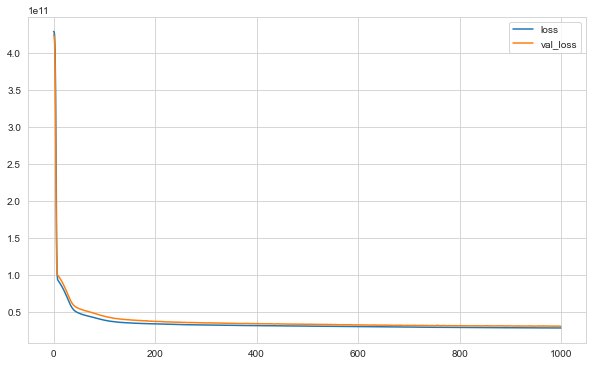

In [208]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

# Buraya bakarak model egitilmis yada egitilmemis ona bakacagiz.
# Egitim cok iyi tamamlanmis OF or UF yoktur.

In [209]:
model.evaluate(X_test, y_test, verbose=0)

25114286080.0

In [210]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [211]:
eval_metric(y_test, y_pred)

r2_score: 0.8045273454274274 
mae: 96988.56065538194 
mse: 25114280124.705933 
rmse: 158474.85644324127


In [212]:
# model.evaluate ile mse degeri hemen hemen ayni

### learning_rate

In [213]:
# step_size = learning_rate * slope

In [214]:
from tensorflow.keras.optimizers import Adam  # optimizer icinde kullaniliyor.

In [215]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003) # default learning rate value is 0.001
# step size 3 kat buyutuldu 0.003/0.001=3
model.compile(optimizer = opt, loss = 'mse')

# model.compile(optimizer = 'adam', loss = 'mse') default lr=0.001
# step = lr * slope
# step size'i artirmak icin lr 10 kat artirilip bir deneme yapilabilir
# overfitting/underfitting gorulurse artis miktari dusurulur


In [216]:
model.weights

[<tf.Variable 'dense_30/kernel:0' shape=(16, 24) dtype=float32, numpy=
 array([[-2.05098093e-02, -1.82524621e-01, -3.77154887e-01,
         -2.03917280e-01, -2.79870629e-03,  2.20505059e-01,
          3.75805795e-01,  1.59454823e-01, -9.35916007e-02,
         -2.16815397e-01,  1.65560722e-01,  2.94585049e-01,
          2.78829515e-01, -7.98341036e-02, -3.30619216e-02,
         -1.63366750e-01,  3.15003753e-01,  9.90016758e-02,
          6.72869682e-02, -3.02372754e-01, -7.13964105e-02,
          2.67592788e-01,  3.59416068e-01, -2.44090065e-01],
        [-8.95346999e-02,  5.14001250e-02,  1.85338080e-01,
          3.02234888e-01, -3.67724866e-01,  8.04318190e-02,
          3.26394320e-01,  4.63053882e-02,  1.18879497e-01,
          5.15573621e-02,  3.81949902e-01,  2.15500116e-01,
         -2.45495737e-01,  3.33640575e-02, -3.81739438e-01,
          1.84317648e-01, -3.54151636e-01, -9.65777636e-02,
         -1.02897644e-01,  3.13820302e-01,  9.90438759e-02,
          3.71018887e-01, -1

In [217]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 428187320320.0000 - val_loss: 420915216384.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 379481784320.0000 - val_loss: 266238705664.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 138398564352.0000 - val_loss: 100015775744.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 91282792448.0000 - val_loss: 96737460224.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 87961165824.0000 - val_loss: 93478600704.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 84483612672.0000 - val_loss: 89825189888.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 80868941824.0000 - val_loss: 86334685184.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 77045014528.0000 - val_loss: 82229518336.0000
Epoch 9/1000
130/1

130/130 [==============================] - 0s 2ms/step - loss: 31481552896.0000 - val_loss: 33848829952.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 31473958912.0000 - val_loss: 33821290496.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 31401820160.0000 - val_loss: 33789368320.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 31321034752.0000 - val_loss: 33651918848.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 31310163968.0000 - val_loss: 33693761536.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 31253630976.0000 - val_loss: 34183421952.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 31311982592.0000 - val_loss: 33727985664.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 31200104448.0000 - val_loss: 33708115968.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 29134845952.0000 - val_loss: 31075710976.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 29126490112.0000 - val_loss: 31004813312.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 29181040640.0000 - val_loss: 30955081728.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 29109391360.0000 - val_loss: 30738980864.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 29036740608.0000 - val_loss: 31362967552.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 29134184448.0000 - val_loss: 31172829184.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 29024428032.0000 - val_loss: 30773774336.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 29112164352.0000 - val_loss: 30916216832.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 27592071168.0000 - val_loss: 31009236992.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 27646814208.0000 - val_loss: 30437476352.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 27639724032.0000 - val_loss: 31450456064.0000
Epoch 400/1000
130/130 [==============================] - 0s 2ms/step - loss: 27710251008.0000 - val_loss: 30455218176.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 27642765312.0000 - val_loss: 30365825024.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 27592884224.0000 - val_loss: 30329438208.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 27540480000.0000 - val_loss: 31021393920.0000
Epoch 404/1000
130/130 [==============================] - 0s 3ms/step - loss: 27601946624.0000 - val_loss: 30278799360.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26928398336.0000 - val_loss: 30816395264.0000
Epoch 530/1000
130/130 [==============================] - 0s 2ms/step - loss: 26909140992.0000 - val_loss: 30901796864.0000
Epoch 531/1000
130/130 [==============================] - 0s 2ms/step - loss: 26897876992.0000 - val_loss: 30537746432.0000
Epoch 532/1000
130/130 [==============================] - 0s 2ms/step - loss: 26878928896.0000 - val_loss: 30988212224.0000
Epoch 533/1000
130/130 [==============================] - 0s 2ms/step - loss: 26904817664.0000 - val_loss: 30479360000.0000
Epoch 534/1000
130/130 [==============================] - 0s 2ms/step - loss: 26896881664.0000 - val_loss: 30582253568.0000
Epoch 535/1000
130/130 [==============================] - 0s 2ms/step - loss: 26899759104.0000 - val_loss: 30933012480.0000
Epoch 536/1000
130/130 [==============================] - 0s 2ms/step - loss: 26944106496.0000 - val_loss: 30558326784.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26400348160.0000 - val_loss: 31468767232.0000
Epoch 662/1000
130/130 [==============================] - 0s 2ms/step - loss: 26419806208.0000 - val_loss: 31267848192.0000
Epoch 663/1000
130/130 [==============================] - 0s 2ms/step - loss: 26330390528.0000 - val_loss: 31476113408.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 26395897856.0000 - val_loss: 31220271104.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 26387103744.0000 - val_loss: 31956011008.0000
Epoch 666/1000
130/130 [==============================] - 0s 2ms/step - loss: 26425976832.0000 - val_loss: 31367471104.0000
Epoch 667/1000
130/130 [==============================] - 0s 2ms/step - loss: 26393573376.0000 - val_loss: 31397578752.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 26411124736.0000 - val_loss: 31573391360.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 19585708032.0000 - val_loss: 25862498304.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 19505164288.0000 - val_loss: 25072605184.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 19528304640.0000 - val_loss: 25102276608.0000
Epoch 796/1000
130/130 [==============================] - 0s 2ms/step - loss: 19477520384.0000 - val_loss: 25043271680.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 19492311040.0000 - val_loss: 25102446592.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 19522623488.0000 - val_loss: 24897167360.0000
Epoch 799/1000
130/130 [==============================] - 0s 2ms/step - loss: 19427297280.0000 - val_loss: 25601880064.0000
Epoch 800/1000
130/130 [==============================] - 0s 2ms/step - loss: 19465803776.0000 - val_loss: 25425989632.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 17325324288.0000 - val_loss: 22872864768.0000
Epoch 926/1000
130/130 [==============================] - 0s 2ms/step - loss: 17315940352.0000 - val_loss: 23098712064.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 17237387264.0000 - val_loss: 23107403776.0000
Epoch 928/1000
130/130 [==============================] - 0s 2ms/step - loss: 17243686912.0000 - val_loss: 23487119360.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 17281716224.0000 - val_loss: 23160303616.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 17230659584.0000 - val_loss: 23544983552.0000
Epoch 931/1000
130/130 [==============================] - 0s 2ms/step - loss: 17234731008.0000 - val_loss: 23057203200.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 17212000256.0000 - val_loss: 23504351232.0000
Epoch 933/1000
130/130 

<AxesSubplot:>

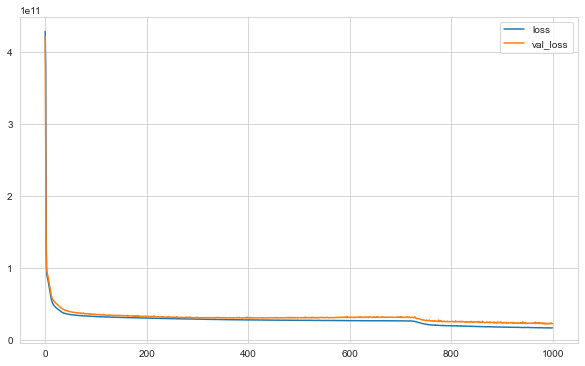

In [218]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

# adimi büyttügümzden dolayi daha detayli grafik elde ettik.

In [219]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [220]:
eval_metric(y_test, y_pred)

r2_score: 0.8824370922145984 
mae: 76333.5027488426 
mse: 15104454404.90695 
rmse: 122900.18065449274


### EarlyStopping

In [221]:
from tensorflow.keras.callbacks import EarlyStopping

# Overfitting i engellemenin yollarindan biridir.
# patience = 25, # bir deger bulununca daha kücük deger buluncaya kadar sabret bulamazsan egitimi durdur
# Egitimin duracagi iyilesmenin olmadigi epoch sayisi
# 430 epochda egitim durduruldu 
# egitim val_loss'un mevcut degerden daha kucuk degerler geldigi muddetce devam eder
# mevcut degerden daha buyuk bir deger geldigi anda patiance miktarinca egitimi devam ettir
# sayet kendinden daha kucuk yeni bir deger gelmezse artik egitimi sonlandirir ve en iyi skorun alindigi andaki parametrelerle
# egitimi sonlandirir


In [222]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [223]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 25, restore_best_weights = True)
# mode=auto hata verebiliyor.
# loss degerine bakmak icin mode = 'min', accuracy, recall degerlerine bakmak icin mode ='max'
# restore_best_weights en iyi degerler alinmasi icin

In [224]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 428187320320.0000 - val_loss: 420915216384.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 379481784320.0000 - val_loss: 266238705664.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 138398564352.0000 - val_loss: 100015775744.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 91282792448.0000 - val_loss: 96737460224.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 87961165824.0000 - val_loss: 93478600704.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 84483612672.0000 - val_loss: 89825189888.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 80868941824.0000 - val_loss: 86334685184.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 77045014528.0000 - val_loss: 82229518336.0000
Epoch 9/1000
130/1

130/130 [==============================] - 0s 2ms/step - loss: 31481552896.0000 - val_loss: 33848829952.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 31473958912.0000 - val_loss: 33821290496.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 31401820160.0000 - val_loss: 33789368320.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 31321034752.0000 - val_loss: 33651918848.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 31310163968.0000 - val_loss: 33693761536.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 31253630976.0000 - val_loss: 34183421952.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 31311982592.0000 - val_loss: 33727985664.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 31200104448.0000 - val_loss: 33708115968.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 29134845952.0000 - val_loss: 31075710976.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 29126490112.0000 - val_loss: 31004813312.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 29181040640.0000 - val_loss: 30955081728.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 29109391360.0000 - val_loss: 30738980864.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 29036740608.0000 - val_loss: 31362967552.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 29134184448.0000 - val_loss: 31172829184.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 29024428032.0000 - val_loss: 30773774336.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 29112164352.0000 - val_loss: 30916216832.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 27592071168.0000 - val_loss: 31009236992.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 27646814208.0000 - val_loss: 30437476352.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 27639724032.0000 - val_loss: 31450456064.0000
Epoch 400/1000
130/130 [==============================] - 0s 2ms/step - loss: 27710251008.0000 - val_loss: 30455218176.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 27642765312.0000 - val_loss: 30365825024.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 27592884224.0000 - val_loss: 30329438208.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 27540480000.0000 - val_loss: 31021393920.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 27601946624.0000 - val_loss: 30278799360.0000
Epoch 405/1000
130/130 

<AxesSubplot:>

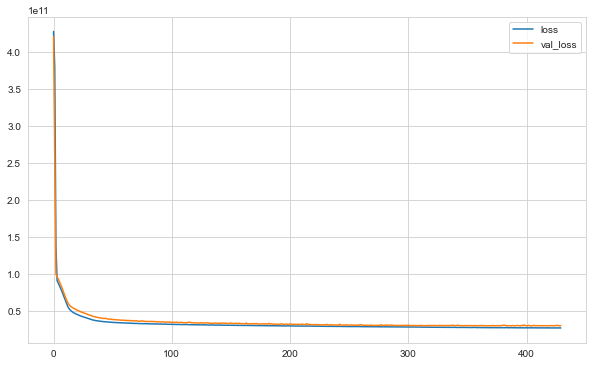

In [225]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

# patience parametresi önemlidir.

In [226]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 2ms/step


In [227]:
eval_metric(y_test, y_pred)

r2_score: 0.8083089490817825 
mae: 96648.1775390625 
mse: 24628420587.453762 
rmse: 156934.44678417087


### Dropout

In [228]:
# Overfitting i engellemek icin kullanilan yöntemlerden biridir.

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

Dropout refers to ignoring units (i.e. neurons) during the training phase of certain set of neurons which is chosen at random. By “ignoring”, I mean these units are not considered during a particular forward or backward pass.

For each hidden layer, for each training sample, for each iteration, ignore (zero out) a random fraction, p, of nodes (and corresponding activations).

![dropout.PNG](https://miro.medium.com/max/1400/1*nty4xtm9UBuWLqxHVaamjw.png)
[Source-1](https://medium.com/@amarbudhiraja/https-medium-com-amarbudhiraja-learning-less-to-learn-better-dropout-in-deep-machine-learning-74334da4bfc5)
[Source-2](https://medium.com/unpackai/introduction-of-dropout-and-ensemble-model-in-the-history-of-deep-learning-a4c2a512dcca)

In [229]:
from tensorflow.keras.layers import Dropout

In [230]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dropout(0.2)) # ilgili katmandaki nöronlarin % kacini kapatayim. 5 civari kapatacak. #Bazi nöronlari kapatarak ezber yapmasini engelliyoruz.
model.add(Dense(24, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(12, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(6, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [231]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 25, restore_best_weights = True)

In [ ]:
# Hangi Hiddenlayerda uygulanmak isteniyorsa hemen layer tanimlandiktan sonra %lik olarak dropuout eklenir
# Random olarak verilen oranda nöron devre disi birakilir
# Asagidaki örnekte her katmanda nöronlarin %20si devre disi birakilmistir
# Bu sekilde overfitting onlenmeye calisilir
# Bu modelde her nekadar overfitting konusu olmasa da egitim amacli tercih edildi
# Overfitting yokken uygulanmasindan dolayi iyi bir egitim malesef gerceklesmedi
# Skorlar düstü


In [232]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 4ms/step - loss: 427606441984.0000 - val_loss: 415625183232.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 296434597888.0000 - val_loss: 108082200576.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 133132435456.0000 - val_loss: 101139259392.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 127097782272.0000 - val_loss: 95764029440.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 123766521856.0000 - val_loss: 90273587200.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 118453698560.0000 - val_loss: 85989539840.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 113359372288.0000 - val_loss: 79088992256.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 109658521600.0000 - val_loss: 73468887040.0000
Epoch 9/1000


130/130 [==============================] - 0s 2ms/step - loss: 72682192896.0000 - val_loss: 38615461888.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 73575800832.0000 - val_loss: 38573064192.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 70757720064.0000 - val_loss: 36549234688.0000
Epoch 136/1000
130/130 [==============================] - 0s 3ms/step - loss: 72178712576.0000 - val_loss: 38340251648.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 69050621952.0000 - val_loss: 36721467392.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 71061315584.0000 - val_loss: 35929071616.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 68300550144.0000 - val_loss: 35619233792.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 71091101696.0000 - val_loss: 41044000768.0000
Epoch 141/1000
130/130 

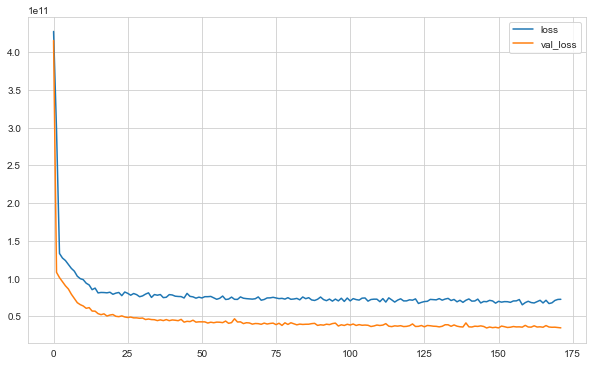

In [233]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

# Modelimizde eger OF varsa Dropout kullancagiz.
# Bu datamizda OF olmadigindan dolayi skorumuz daha kötü hale geldi. 

In [234]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [235]:
eval_metric(y_test, y_pred)

r2_score: 0.7787619092601538 
mae: 104301.88352141203 
mse: 28424617229.683968 
rmse: 168596.01783459765


## Saving Final Model and Scaler

In [236]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))

In [237]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(24, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(24, activation = 'relu'))
model.add(Dense(12, activation = 'relu'))
model.add(Dense(6, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

# learning_rate, earlystop isimize yaradigindan dolayi kullandik. 
# Dropout kullanmadik, cünkü skoru kötü hale getirdi.

In [238]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 100, restore_best_weights = True)

In [239]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1500,
         callbacks = [early_stop]
         )
# bu sefer datamı train setim ile eğiteyim ama validation'ı test setleri ile yapayım.
# çünkü tüm data seti ile train edersem validation'ı öğrendiği data ile yapmak zorunda kalırım.

# fakat bu final modelde önceki adımdaki modelden farkı, bu sefer train datamda %15 lik validation_split bölümü ayrılmamış. 
# yani önceki adıma göre yine fazla bir data ile eğitiyorum!

Epoch 1/1500
152/152 [==============================] - 1s 3ms/step - loss: 426800119808.0000 - val_loss: 409361121280.0000
Epoch 2/1500
152/152 [==============================] - 0s 2ms/step - loss: 315660664832.0000 - val_loss: 126727020544.0000
Epoch 3/1500
152/152 [==============================] - 0s 2ms/step - loss: 97281622016.0000 - val_loss: 85677850624.0000
Epoch 4/1500
152/152 [==============================] - 0s 2ms/step - loss: 90049626112.0000 - val_loss: 81739857920.0000
Epoch 5/1500
152/152 [==============================] - 0s 2ms/step - loss: 85915238400.0000 - val_loss: 77438582784.0000
Epoch 6/1500
152/152 [==============================] - 0s 2ms/step - loss: 81497939968.0000 - val_loss: 72982388736.0000
Epoch 7/1500
152/152 [==============================] - 0s 2ms/step - loss: 76623667200.0000 - val_loss: 67959148544.0000
Epoch 8/1500
152/152 [==============================] - 0s 2ms/step - loss: 71287717888.0000 - val_loss: 62828179456.0000
Epoch 9/1500
152/152

152/152 [==============================] - 0s 2ms/step - loss: 31174277120.0000 - val_loss: 26943553536.0000
Epoch 134/1500
152/152 [==============================] - 0s 2ms/step - loss: 31075944448.0000 - val_loss: 26975582208.0000
Epoch 135/1500
152/152 [==============================] - 0s 2ms/step - loss: 31200759808.0000 - val_loss: 26964871168.0000
Epoch 136/1500
152/152 [==============================] - 0s 2ms/step - loss: 31010965504.0000 - val_loss: 26997872640.0000
Epoch 137/1500
152/152 [==============================] - 0s 2ms/step - loss: 31110033408.0000 - val_loss: 26857351168.0000
Epoch 138/1500
152/152 [==============================] - 0s 2ms/step - loss: 31003428864.0000 - val_loss: 26841485312.0000
Epoch 139/1500
152/152 [==============================] - 0s 2ms/step - loss: 30929414144.0000 - val_loss: 26766196736.0000
Epoch 140/1500
152/152 [==============================] - 0s 2ms/step - loss: 30957191168.0000 - val_loss: 26743836672.0000
Epoch 141/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 28326381568.0000 - val_loss: 24684507136.0000
Epoch 266/1500
152/152 [==============================] - 0s 2ms/step - loss: 28340004864.0000 - val_loss: 24745177088.0000
Epoch 267/1500
152/152 [==============================] - 0s 2ms/step - loss: 28378611712.0000 - val_loss: 24638941184.0000
Epoch 268/1500
152/152 [==============================] - 0s 2ms/step - loss: 28370982912.0000 - val_loss: 24684943360.0000
Epoch 269/1500
152/152 [==============================] - 0s 2ms/step - loss: 28452800512.0000 - val_loss: 24617254912.0000
Epoch 270/1500
152/152 [==============================] - 0s 2ms/step - loss: 28329541632.0000 - val_loss: 24605018112.0000
Epoch 271/1500
152/152 [==============================] - 0s 2ms/step - loss: 28358795264.0000 - val_loss: 24612052992.0000
Epoch 272/1500
152/152 [==============================] - 0s 2ms/step - loss: 28268722176.0000 - val_loss: 25009158144.0000
Epoch 273/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 27619534848.0000 - val_loss: 23644815360.0000
Epoch 398/1500
152/152 [==============================] - 0s 2ms/step - loss: 27577860096.0000 - val_loss: 23482017792.0000
Epoch 399/1500
152/152 [==============================] - 0s 2ms/step - loss: 27564169216.0000 - val_loss: 23500984320.0000
Epoch 400/1500
152/152 [==============================] - 0s 2ms/step - loss: 27505350656.0000 - val_loss: 23493652480.0000
Epoch 401/1500
152/152 [==============================] - 0s 2ms/step - loss: 27500232704.0000 - val_loss: 23527358464.0000
Epoch 402/1500
152/152 [==============================] - 0s 2ms/step - loss: 27535200256.0000 - val_loss: 23508731904.0000
Epoch 403/1500
152/152 [==============================] - 0s 2ms/step - loss: 27562979328.0000 - val_loss: 23489144832.0000
Epoch 404/1500
152/152 [==============================] - 0s 2ms/step - loss: 27500208128.0000 - val_loss: 23452340224.0000
Epoch 405/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 26764140544.0000 - val_loss: 22479046656.0000
Epoch 530/1500
152/152 [==============================] - 0s 2ms/step - loss: 26758576128.0000 - val_loss: 22465662976.0000
Epoch 531/1500
152/152 [==============================] - 0s 2ms/step - loss: 26739752960.0000 - val_loss: 22365718528.0000
Epoch 532/1500
152/152 [==============================] - 0s 2ms/step - loss: 26584207360.0000 - val_loss: 22335158272.0000
Epoch 533/1500
152/152 [==============================] - 0s 2ms/step - loss: 26562699264.0000 - val_loss: 22245017600.0000
Epoch 534/1500
152/152 [==============================] - 0s 2ms/step - loss: 26522697728.0000 - val_loss: 22228088832.0000
Epoch 535/1500
152/152 [==============================] - 0s 2ms/step - loss: 26461007872.0000 - val_loss: 22362347520.0000
Epoch 536/1500
152/152 [==============================] - 0s 2ms/step - loss: 26516998144.0000 - val_loss: 22120103936.0000
Epoch 537/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 18535124992.0000 - val_loss: 15823812608.0000
Epoch 662/1500
152/152 [==============================] - 0s 2ms/step - loss: 18478614528.0000 - val_loss: 15859097600.0000
Epoch 663/1500
152/152 [==============================] - 0s 2ms/step - loss: 18465431552.0000 - val_loss: 15842268160.0000
Epoch 664/1500
152/152 [==============================] - 0s 2ms/step - loss: 18408679424.0000 - val_loss: 15925688320.0000
Epoch 665/1500
152/152 [==============================] - 0s 2ms/step - loss: 18360129536.0000 - val_loss: 15891116032.0000
Epoch 666/1500
152/152 [==============================] - 0s 2ms/step - loss: 18366537728.0000 - val_loss: 15689638912.0000
Epoch 667/1500
152/152 [==============================] - 0s 2ms/step - loss: 18304731136.0000 - val_loss: 15811655680.0000
Epoch 668/1500
152/152 [==============================] - 0s 2ms/step - loss: 18351366144.0000 - val_loss: 15991299072.0000
Epoch 669/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 16159706112.0000 - val_loss: 14229300224.0000
Epoch 794/1500
152/152 [==============================] - 0s 2ms/step - loss: 16146326528.0000 - val_loss: 14442275840.0000
Epoch 795/1500
152/152 [==============================] - 0s 2ms/step - loss: 16160181248.0000 - val_loss: 14244807680.0000
Epoch 796/1500
152/152 [==============================] - 0s 2ms/step - loss: 16172219392.0000 - val_loss: 14232190976.0000
Epoch 797/1500
152/152 [==============================] - 0s 2ms/step - loss: 16224151552.0000 - val_loss: 14213086208.0000
Epoch 798/1500
152/152 [==============================] - 0s 2ms/step - loss: 16216095744.0000 - val_loss: 14484983808.0000
Epoch 799/1500
152/152 [==============================] - 0s 2ms/step - loss: 16175413248.0000 - val_loss: 14220273664.0000
Epoch 800/1500
152/152 [==============================] - 0s 2ms/step - loss: 16032744448.0000 - val_loss: 14288165888.0000
Epoch 801/1500
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 14222945280.0000 - val_loss: 12692759552.0000
Epoch 926/1500
152/152 [==============================] - 0s 2ms/step - loss: 14143437824.0000 - val_loss: 12887319552.0000
Epoch 927/1500
152/152 [==============================] - 0s 2ms/step - loss: 14214863872.0000 - val_loss: 12656262144.0000
Epoch 928/1500
152/152 [==============================] - 0s 2ms/step - loss: 14085520384.0000 - val_loss: 12662926336.0000
Epoch 929/1500
152/152 [==============================] - 0s 2ms/step - loss: 14103842816.0000 - val_loss: 12540907520.0000
Epoch 930/1500
152/152 [==============================] - 0s 2ms/step - loss: 14016058368.0000 - val_loss: 12663810048.0000
Epoch 931/1500
152/152 [==============================] - 0s 2ms/step - loss: 14062556160.0000 - val_loss: 12934515712.0000
Epoch 932/1500
152/152 [==============================] - 0s 2ms/step - loss: 14062723072.0000 - val_loss: 12991637504.0000
Epoch 933/1500
152/152 

Epoch 1057/1500
152/152 [==============================] - 0s 2ms/step - loss: 12845434880.0000 - val_loss: 11894871040.0000
Epoch 1058/1500
152/152 [==============================] - 0s 2ms/step - loss: 12875073536.0000 - val_loss: 11898207232.0000
Epoch 1059/1500
152/152 [==============================] - 0s 2ms/step - loss: 12911881216.0000 - val_loss: 11897230336.0000
Epoch 1060/1500
152/152 [==============================] - 0s 2ms/step - loss: 12832649216.0000 - val_loss: 11922891776.0000
Epoch 1061/1500
152/152 [==============================] - 0s 2ms/step - loss: 12848362496.0000 - val_loss: 11895570432.0000
Epoch 1062/1500
152/152 [==============================] - 0s 2ms/step - loss: 12881243136.0000 - val_loss: 11936891904.0000
Epoch 1063/1500
152/152 [==============================] - 0s 2ms/step - loss: 12760247296.0000 - val_loss: 12112728064.0000
Epoch 1064/1500
152/152 [==============================] - 0s 2ms/step - loss: 12764956672.0000 - val_loss: 12054092800.0000


152/152 [==============================] - 0s 2ms/step - loss: 12349524992.0000 - val_loss: 11911678976.0000
Epoch 1188/1500
152/152 [==============================] - 0s 2ms/step - loss: 12308625408.0000 - val_loss: 11788462080.0000
Epoch 1189/1500
152/152 [==============================] - 0s 2ms/step - loss: 12330913792.0000 - val_loss: 11883864064.0000
Epoch 1190/1500
152/152 [==============================] - 0s 2ms/step - loss: 12251451392.0000 - val_loss: 11859430400.0000
Epoch 1191/1500
152/152 [==============================] - 0s 2ms/step - loss: 12347906048.0000 - val_loss: 11829524480.0000
Epoch 1192/1500
152/152 [==============================] - 0s 2ms/step - loss: 12325213184.0000 - val_loss: 11933283328.0000
Epoch 1193/1500
152/152 [==============================] - 0s 2ms/step - loss: 12129974272.0000 - val_loss: 11913379840.0000
Epoch 1194/1500
152/152 [==============================] - 0s 2ms/step - loss: 12290203648.0000 - val_loss: 11894115328.0000
Epoch 1195/1500


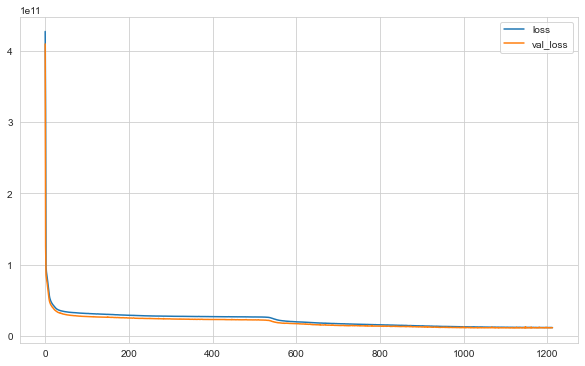

In [240]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();


In [241]:
y_pred = model.predict(X_test)

68/68 [==============================] - 0s 1ms/step


In [242]:
eval_metric(y_test, y_pred) # 88 den 90 a cikti skorumuz.

r2_score: 0.9093968239505518 
mae: 67682.21162471065 
mse: 11640674489.582361 
rmse: 107891.95748331922


In [243]:
model.save('model_kc_house.h5')  # creates a HDF5 file 'my_model.h5'

## Loading Model and Scaler

In [244]:
from tensorflow.keras.models import load_model

In [245]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [246]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,built|renovated
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,47.511,-122.257,1340,5650,1955.000


In [247]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.57149751, 0.21760797, 0.15304348, 0.00573322,
        0.47826087]])

In [248]:
model_kc_house.predict(single_house)

1/1 [==============================] - 0s 67ms/step


array([[243255.73]], dtype=float32)

In [249]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [250]:
from sklearn.linear_model import LinearRegression 

In [251]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.7054431219005433 
mae: 124715.1481019047 
mse: 37844597575.166885 
rmse: 194536.87973021177


### Random Forest

In [252]:
from sklearn.ensemble import RandomForestRegressor

In [253]:
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.8912532816836695 
mae: 64653.2709236993 
mse: 13971752480.727938 
rmse: 118202.16783429963


In [ ]:
# DL genellikle unstructured Data ile calisiyor. Resim, text gibi...
# 26000 satirlik datamiz vardi bunu DL yapmaya calisitk, ama ML kullanilmasi daha anlamlidir.
# Genelde datatlarin %85 i ML yöntemleri ile cözülebiliyor.

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___